In [1]:

# Set up
import json
import pandas as pd
import datetime
import numpy as np
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
pd.set_option('mode.chained_assignment', None)
pd.set_option('max_colwidth', 50)

import plotly.offline as py
py.init_notebook_mode(connected=False)
import plotly.graph_objs as go

%matplotlib inline

import seaborn as sns
sns.set()
sns.set_context("talk")

In [2]:
import pymongo
import pandas as pd
from pymongo import MongoClient

In [3]:
client = MongoClient()

#point the client at mongo URI
client = MongoClient('mongodb://localhost:27017')
#select database
db = client['Yelp_Database']
print(db)

Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'Yelp_Database')


In [4]:
#select the collection within the database
business_joined = db['business_review_joined']
print(business_joined)

Collection(Database(MongoClient(host=['localhost:27017'], document_class=dict, tz_aware=False, connect=True), 'Yelp_Database'), 'business_review_joined')


In [5]:
cursor = business_joined.find()
print(cursor)

In [6]:
import warnings
warnings.filterwarnings("ignore")
def batched(cursor, batch_size):
    batch = []
    for doc in cursor:
        batch.append(doc)
        if batch and not len(batch) % batch_size:
            yield batch
            batch = []

    if batch:   # last documents
        yield batch

df = pd.DataFrame()
for batch in batched(cursor, 10000):
    df = df.append(batch, ignore_index=True)

In [7]:
restaurants_reviews = df

In [11]:
restaurants_reviews.shape

(497887, 34)

In [8]:
restaurants_reviews.columns

Index(['_id', 'address', 'business_id', 'city', 'is_open', 'latitude',
       'longitude', 'name', 'postal_code', 'review_count', 'restaurant_stars',
       'state', 'DogsAllowed', 'RestaurantsTakeOut', 'HappyHour',
       'OutdoorSeating', 'GoodForKids', 'HasTV', 'RestaurantsReservations',
       'WheelchairAccessible', 'RestaurantsPriceRange', 'Wifi', 'Noiselevel',
       'Alcohol', 'DriveThru', 'Categories', 'cool', 'date', 'funny',
       'review_id', 'stars', 'text', 'useful'],
      dtype='object')

In [9]:
# label reviews as positive or negative
restaurants_reviews['labels'] = ''
restaurants_reviews.loc[restaurants_reviews.stars >=3.5, 'labels'] = 'positive'
restaurants_reviews.loc[restaurants_reviews.stars ==3.0, 'labels'] = 'neutral'
restaurants_reviews.loc[restaurants_reviews.stars <3, 'labels'] = 'negative'

# drop neutral reviews for easy analysis
restaurants_reviews.head()

,_id,address,business_id,city,is_open,latitude,longitude,name,postal_code,review_count,...,DriveThru,Categories,cool,date,funny,review_id,stars,text,useful,labels
0,6401ef1fd5810c1906e485c1,"2001 Piazza Ave, Ste 100",-I8rPwW2mH-pxMeyk22f7g,Wesley Chapel,0,28.189038,-82.347692,Pagelli's Italiano,33543,13,...,False,Italian,2,2012-06-26 18:31:16,1,Mgw2Tzea5quFVwBQL1OFYA,4,I think its funny when people bitch that there...,3,positive
1,6401ef1fd5810c1906e485c2,"2001 Piazza Ave, Ste 100",-I8rPwW2mH-pxMeyk22f7g,Wesley Chapel,0,28.189038,-82.347692,Pagelli's Italiano,33543,13,...,False,Italian,1,2011-12-02 14:05:58,1,8sOaDBSRKSMvvgd-FF7-cQ,3,"My wife and I just had our second child, and w...",3,neutral
2,6401ef1fd5810c1906e485c3,"2001 Piazza Ave, Ste 100",-I8rPwW2mH-pxMeyk22f7g,Wesley Chapel,0,28.189038,-82.347692,Pagelli's Italiano,33543,13,...,False,Italian,0,2011-04-26 03:15:09,0,a00WNmUzoFv4jlJ7qHsnbQ,4,I eat at pagelli's italiano for the first time...,0,positive
3,6401ef1fd5810c1906e485c4,"2001 Piazza Ave, Ste 100",-I8rPwW2mH-pxMeyk22f7g,Wesley Chapel,0,28.189038,-82.347692,Pagelli's Italiano,33543,13,...,False,Italian,0,2011-10-02 02:20:39,0,BZXl-NZ2zkah2Q_7E6RDkg,4,Went here for the early dinner special before ...,0,positive
4,6401ef1fd5810c1906e485c5,"2001 Piazza Ave, Ste 100",-I8rPwW2mH-pxMeyk22f7g,Wesley Chapel,0,28.189038,-82.347692,Pagelli's Italiano,33543,13,...,False,Italian,0,2011-11-06 00:51:34,0,nAeVYBEmx1Xf5EXxRo1fKA,1,"Went for dinner, and never even got our food. ...",2,negative


In [91]:
restaurants_reviews[restaurants_reviews.text.str.contains(' die ')]
restaurants_reviews[restaurants_reviews.review_id == 'arWOtx6kXscEiY4jM7VUnw']

,_id,address,business_id,city,is_open,latitude,longitude,name,postal_code,review_count,...,cool,date,funny,review_id,stars,text,useful,labels,num_words_review,removed_punct_text
110,6401ef1fd5810c1906e4862f,917 11th St,-nkdsrNAQoHEve7j_k-_qg,Palm Harbor,0,28.076897,-82.766289,Lulu's Beach House,34683,41,...,0,2013-02-26 12:42:24,0,Tq_JWC4ETGVXgB3vFuzk4g,4,"wonderful, wondereful, wonderful! adorable pla...",0,positive,78,wonderful wondereful wonderful adorable place ...
218,6401ef1fd5810c1906e4869b,2779 Gulf To Bay Blvd,02HdjzKf7pUujFqYIvKiFg,Clearwater,1,27.960264,-82.721451,Indian Bistro,33759,241,...,0,2014-07-11 13:53:50,0,norAbc-RtqD4Dq5ydqgy4w,5,i have to say the chicken tikka marsala is to ...,0,positive,51,i have to say the chicken tikka marsala is to ...
237,6401ef1fd5810c1906e486ae,2779 Gulf To Bay Blvd,02HdjzKf7pUujFqYIvKiFg,Clearwater,1,27.960264,-82.721451,Indian Bistro,33759,241,...,0,2018-06-10 01:16:40,0,dK6XQLOPVX9ROHhxJIb9Og,5,this place is amazing! their butter chicken is...,0,positive,68,this place is amazing their butter chicken is ...
257,6401ef1fd5810c1906e486c2,2779 Gulf To Bay Blvd,02HdjzKf7pUujFqYIvKiFg,Clearwater,1,27.960264,-82.721451,Indian Bistro,33759,241,...,2,2014-03-01 01:18:57,1,a3tFyQV9Pkv_zixQ2aHimw,5,"first, let me say that i have lived in both in...",5,positive,231,first let me say that i have lived in both ind...
329,6401ef1fd5810c1906e4870a,2779 Gulf To Bay Blvd,02HdjzKf7pUujFqYIvKiFg,Clearwater,1,27.960264,-82.721451,Indian Bistro,33759,241,...,0,2016-06-07 22:16:01,0,ZAuxLlUNKglxrKwY-P-j9w,4,"excellent atmosphere, best vegetable samosas i...",0,positive,46,excellent atmosphere best vegetable samosas i'...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497403,6401ef32d5810c1906ec12be,2233 Gulf To Bay Blvd,sBquL4QKMhTKPL2moFF2GA,Clearwater,1,27.960045,-82.744344,Russo's New York Pizzeria - Clearwater,33765,207,...,1,2017-02-14 20:04:51,0,VrqYyVAOkG_zkedHgZlrQw,5,the best italian food we have had in a long ti...,1,positive,82,the best italian food we have had in a long ti...
497406,6401ef32d5810c1906ec12c1,2233 Gulf To Bay Blvd,sBquL4QKMhTKPL2moFF2GA,Clearwater,1,27.960045,-82.744344,Russo's New York Pizzeria - Clearwater,33765,207,...,0,2019-02-16 23:25:31,0,6ogSzmq4TkL_oMcEp7I_mA,5,we love this place. the pizza is absolutely am...,1,positive,97,we love this place the pizza is absolutely ama...
497653,6401ef32d5810c1906ec13b8,19651 Bruce B Downs,u0JEC2BTLJhoopEHtH0_2Q,Tampa,0,28.152739,-82.352402,Full Circle Pizza & Grill,33647,82,...,1,2014-10-12 01:33:37,0,W8zx-qfUL3yja_l7QzEmkA,5,best chicago style pizza .... delicious. great...,1,positive,23,best chicago style pizza delicious great serv...
497725,6401ef32d5810c1906ec1400,"3150 Tampa Rd, Ste 7",vF-uptiQ34pVLHJKzPHUlA,Oldsmar,0,28.049869,-82.698361,My Greek Corner,34677,73,...,0,2021-01-08 15:56:19,0,J0_qFJnViqq1WbbXzVvBOw,5,this is the best greek restaurant i have been ...,0,positive,144,this is the best greek restaurant i have been ...


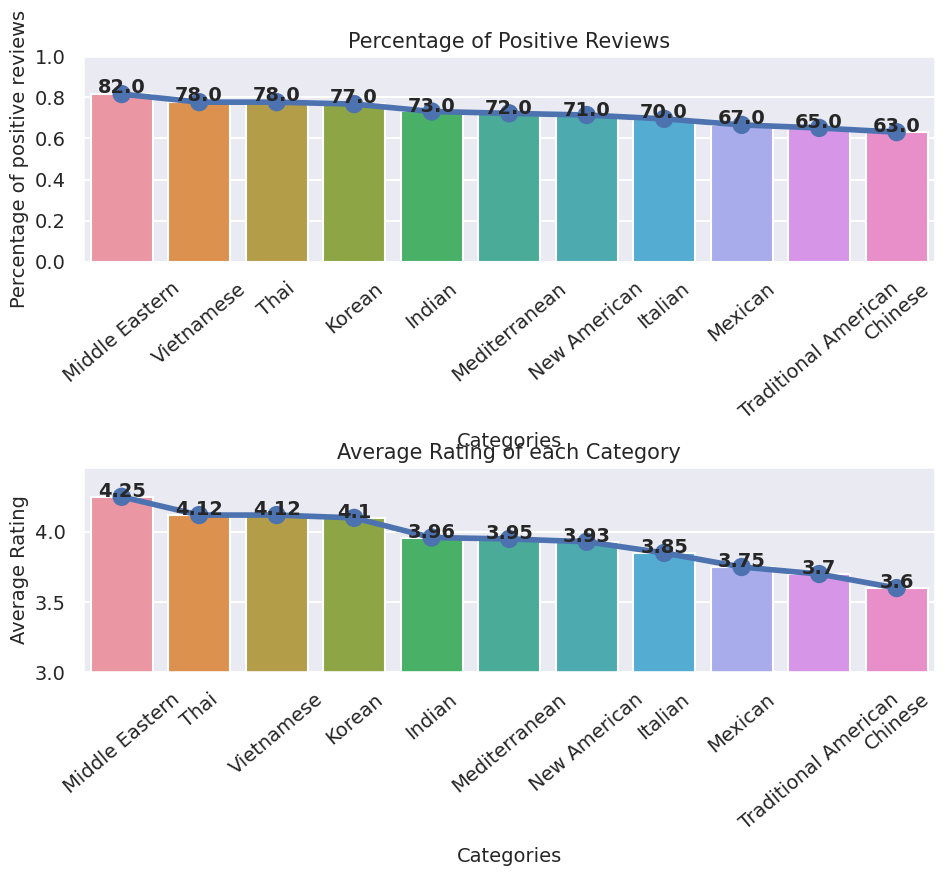

In [10]:
table = pd.pivot_table(restaurants_reviews, values=["review_id"], index=["Categories"],columns=["labels"], 
                       aggfunc=len, margins=True, dropna=True,fill_value=0)
table_percentage = table.div( table.iloc[:,-1], axis=0).iloc[:-1,-2].sort_values(ascending=False)
plt.figure(figsize=(11,8))
plt.subplot(211)
sns.barplot(x=table_percentage.index, y= table_percentage.values)
sns.pointplot(x=table_percentage.index, y= table_percentage.values)
plt.xlabel('Categories', labelpad=7, fontsize=14)
plt.ylabel('Percentage of positive reviews', fontsize=14)
plt.title('Percentage of Positive Reviews', fontsize=15)
plt.tick_params(labelsize=14)
plt.xticks(rotation=40)
for  i, v in enumerate(table_percentage.round(2)):
    plt.text(i, v*1.001, str(v*100), horizontalalignment ='center',fontweight='bold', fontsize=14)
plt.ylim([0.0,1.0])   

#-------------------------------------------------------------------------------#
plt.subplot(212)
grouped = restaurants_reviews.groupby('Categories')['stars'].mean().round(2).sort_values(ascending=False)
sns.barplot(grouped.index, grouped.values)
sns.pointplot(grouped.index, grouped.values)
plt.ylim(3)
plt.xlabel('Categories', labelpad=10, fontsize=14)
plt.ylabel('Average Rating', fontsize=14)
plt.title('Average Rating of each Category', fontsize=15)
plt.tick_params(labelsize=14)
plt.xticks(rotation=40)
for  i, v in enumerate(grouped):
    plt.text(i, v, str(round(v,2)), horizontalalignment ='center',fontweight='bold', fontsize=14)
    
plt.subplots_adjust(hspace=1)

**Middle Eastern Cuisine Dominates in terms of average ratings and percent positive reviews. Traditional American cuisine is observed to have second least average rating and percent positive reviews in Florida State**

In [13]:
table

review_id                         
labels                negative neutral positive     All
Categories                                             
Chinese                   6328    2854    15685   24867
Indian                    1681     883     6980    9544
Italian                  12590    5509    41305   59404
Korean                     637     527     3838    5002
Mediterranean             1771    1045     7324   10140
Mexican                  13843    6201    39988   60032
Middle Eastern             660     364     4546    5570
New American             17819   11061    72139  101019
Thai                      2760    1631    15276   19667
Traditional American     43681   22755   123963  190399
Vietnamese                1510    1223     9510   12243
All                     103280   54053   340554  497887

**Removing all the punctations/special symbols and next line characters, then generating count of the words in each review**

In [14]:
restaurants_reviews['num_words_review'] = restaurants_reviews.text.str.replace('\n',''). \
                                          str.replace('[!"#$%&\()*+,-./:;<=>?@[\\]^_`{|}~]','').map(lambda x: len(x.split()))

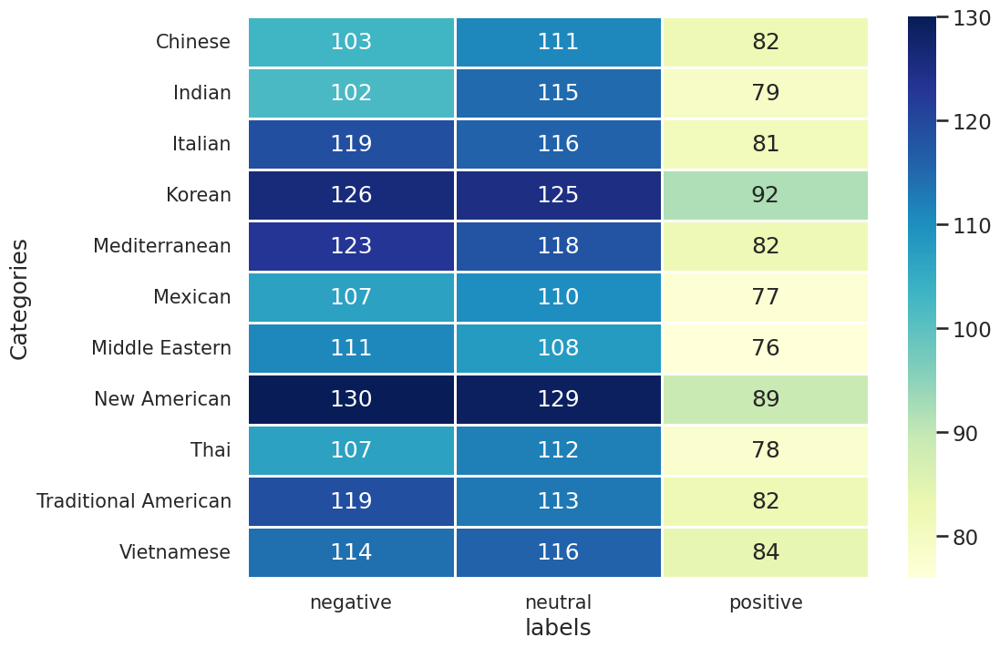

In [15]:
table = restaurants_reviews.groupby(['Categories','labels'])['num_words_review'].mean().round().unstack()
plt.figure(figsize=(11,8))
sns.heatmap(table, cmap='YlGnBu', fmt='g',annot=True, linewidths=1)
plt.tick_params(labelsize=15)

It is observed that while giving positive reviews, people tend use less than 100 words to write review. However while writing negative and neutral reviews people use more than 100 words.

For New American Cuisine, negative reviews have on an average 130 words, which is the most. Whereas middle eastern cuisine, which has the highest average rating, have on an average 76 words in positive reviews, which is the least of all.

In [16]:
restaurants_reviews.text.str.replace('\n',''). \
                                          str.replace('[!"#$%&\()*+,-./:;<=>?@[\\]^_`{|}~]','').map(lambda x: len(x.split())).mean()

93.49947076344633

In [17]:
table.mean()

labels
negative    114.636364
neutral     115.727273
positive     82.000000
dtype: float64

In [18]:
review_stars = restaurants_reviews['stars'].value_counts()
review_stars_percent = review_stars.apply(lambda i : i / len(restaurants_reviews) * 100)
review_stars_percent

5    46.183773
4    22.216085
1    12.387951
3    10.856479
2     8.355711
Name: stars, dtype: float64

When we count the number of reviews for different stars, it is clear to see that most people - 46% tended to give 5-star or 4-star ratings (almost 23%), which means that for about 69% people were at least satisfied with their businesses. And then, the third highest rating star was 1-star with 13.3%. Of course, this data makes sense because most customers only write reviews when they have very positive or negative experiences. Writing reviews takes a decent amount of effort, so unless a customer is highly motivated or so disappointed, it’s unlikely that they write anything at all (barring external factors like incentives).

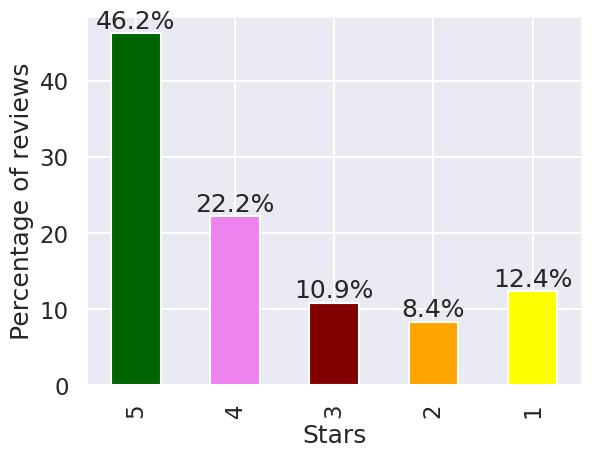

In [19]:
c = ['darkgreen','violet','maroon','orange','yellow']
ax = review_stars_percent.sort_index(ascending=False).plot(kind='bar',color=c)

for patch in ax.patches:
    x = patch.get_bbox().get_points()[:, 0]
    y = patch.get_bbox().get_points()[1, 1]
    ax.annotate('{:.1f}%'.format(y), (x.mean(), y), ha='center', va='bottom')
plt.ylabel('Percentage of reviews')
plt.xlabel('Stars');

5 star and 4 star rating reviews occupy 68.4% of the total review ratings, in general it can be said that restaurant businesses are being perceived in good light by most restaurant going people in Florida state.

In [20]:
# Filter out unavailable reviews. At least have one vote in all three options.
avai_reviews = restaurants_reviews.query("useful > 0 and cool > 0 and funny > 0")
print("Number of available reviews: ", len(avai_reviews))

Number of available reviews:  36529


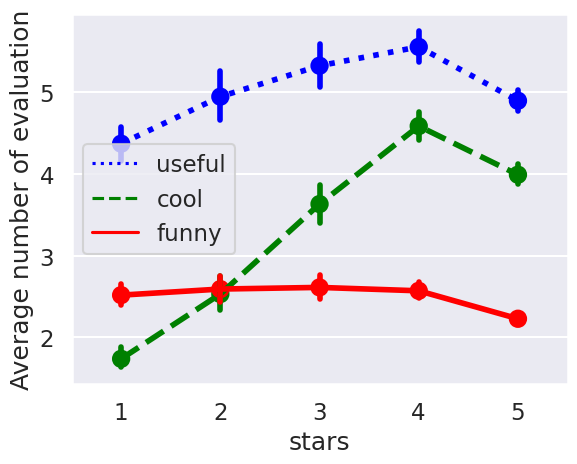

In [21]:
import matplotlib.lines as mlines
sns.pointplot(x = 'stars', y = 'useful', data = avai_reviews, color="blue", linestyles='dotted')
sns.pointplot(x = 'stars', y = 'cool', data = avai_reviews, color="green", linestyles='--')
sns.pointplot(x = 'stars', y = 'funny', data = avai_reviews, color="red")
lg1 = mlines.Line2D([], [], color='blue', label='useful', linestyle='dotted')
lg2 = mlines.Line2D([], [], color='green', label='cool', linestyle='--')
lg3 = mlines.Line2D([], [], color='red', label='funny')
plt.ylabel('Average number of evaluation')
plt.legend(handles=[lg1, lg2, lg3]);

In [22]:
import folium

In [23]:
list_coor=restaurants_reviews[['name','latitude','longitude','restaurant_stars']].drop_duplicates(keep='last').values.tolist()
map_new=folium.Map(location=[27.9506, -82.4572],zoom_start=10)
for i in list_coor:
    map_new.add_child(folium.Marker(location=[i[1],i[2]],
                                popup=(i[0],i[3]),icon=folium.Icon(color='purple')))
map_new

In [24]:
list_coor=restaurants_reviews[['name','latitude','longitude','restaurant_stars','city']].drop_duplicates(keep='last')
list_coor_filter = list_coor[list_coor['city']=='Tampa'].values.tolist()
map_new=folium.Map(location=[27.9506, -82.4572],zoom_start=12)
for i in list_coor_filter:
    map_new.add_child(folium.Marker(location=[i[1],i[2]],
                                popup=(i[0],i[3]),icon=folium.Icon(color='green')))
map_new

In [29]:
despite being native import csv
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC

In [30]:
## convert text to lower case
restaurants_reviews.text = restaurants_reviews.text.str.lower()

## remove unnecessary punctuation
restaurants_reviews['removed_punct_text']= restaurants_reviews.text.str.replace('\n',''). \
                                          str.replace('[!"#$%&\()*+,-./:;<=>?@[\\]^_`{|}~]','')

In [46]:
## import positive file which contains common meaningless positive words such as good
file_positive = open('positive.txt',encoding = "ISO-8859-1")
reader =csv.reader(file_positive)
positive_words = [word[0] for word in reader]

## import negative file which contains common meaningless positive words such as bad
file_negative = open('negative.txt',encoding = "ISO-8859-1")
reader =csv.reader(file_negative)
negative_words = [word[0] for word in reader]

In [28]:
## get dataset by category
def get_dataset(category):
    df = restaurants_reviews[['removed_punct_text','labels']][restaurants_reviews.Categories==category]
    df.reset_index(drop=True, inplace =True)
    df=df.loc[df['labels']!='neutral']
    df.rename(columns={'removed_punct_text':'text'}, inplace=True)
    return df

#For timeseries graphs
def get_dataset_time(category):
    df = restaurants_reviews[['review_id','date']][restaurants_reviews.Categories==category]
    df.reset_index(drop=True, inplace =True)
    return df

## only keep positive and negative words
def filter_words(review):
    words = [word for word in review.split() if word in positive_words + negative_words]
    words = ' '.join(words)
    return words

In [29]:
restaurants_reviews.columns

Index(['_id', 'address', 'business_id', 'city', 'is_open', 'latitude',
       'longitude', 'name', 'postal_code', 'review_count', 'restaurant_stars',
       'state', 'DogsAllowed', 'RestaurantsTakeOut', 'HappyHour',
       'OutdoorSeating', 'GoodForKids', 'HasTV', 'RestaurantsReservations',
       'WheelchairAccessible', 'RestaurantsPriceRange', 'Wifi', 'Noiselevel',
       'Alcohol', 'DriveThru', 'Categories', 'cool', 'date', 'funny',
       'review_id', 'stars', 'text', 'useful', 'labels', 'num_words_review',
       'removed_punct_text'],
      dtype='object')

In [92]:
def get_polarity_score(dataset):
    dataset.text = dataset.text.apply(filter_words) #apply filter_words function to the text column
    
    terms_train=list(dataset['text'])
    class_train=list(dataset['labels'])
    
    ## get bag of words
    vectorizer = CountVectorizer()
    feature_train_counts=vectorizer.fit_transform(terms_train)
    
    ## run model
    svm = LinearSVC()
    svm.fit(feature_train_counts, class_train)
    
    ## create dataframe for score of each word in a review calculated by svm model
    coeff = svm.coef_[0]
    cuisine_words_score = pd.DataFrame({'score': coeff, 'word': vectorizer.get_feature_names_out()})
    
    ## get frequency of each word in all reviews in specific category
    cuisine_reviews = pd.DataFrame(feature_train_counts.toarray(), columns=vectorizer.get_feature_names_out())
    cuisine_reviews['labels'] = class_train
    cuisine_frequency = cuisine_reviews[cuisine_reviews['labels'] =='positive'].sum()[:-1]
    
    cuisine_words_score.set_index('word', inplace=True)
    cuisine_polarity_score = cuisine_words_score
    cuisine_polarity_score['frequency'] = cuisine_frequency
    
    cuisine_polarity_score.score = cuisine_polarity_score.score.astype(float)
    cuisine_polarity_score.frequency = cuisine_polarity_score.frequency.astype(int)
    
    ## calculate polarity score 
    cuisine_polarity_score['polarity'] = cuisine_polarity_score.score * cuisine_polarity_score.frequency / cuisine_reviews.shape[0]
    
    cuisine_polarity_score.polarity = cuisine_polarity_score.polarity.astype(float)
    ## drop unnecessary words
    unuseful_positive_words = ['delicious','great','amazing','love','best','awesome','excellent','good',
                                                   'favorite','loved','perfect','gem','perfectly','wonderful',
                                                    'happy','enjoyed','nice','well','super','like','better','decent','fine',
                                                    'pretty','enough','excited','impressed','ready','fantastic','glad','right',
                                                    'fabulous']
    unuseful_negative_words =  ['bad','disappointed','unfortunately','disappointing','horrible',
                                                    'lacking','terrible','sorry']
    unuseful_words = unuseful_positive_words + unuseful_negative_words
    cuisine_polarity_score.drop(cuisine_polarity_score.loc[unuseful_words].index, axis=0, inplace=True)
    
    return cuisine_polarity_score



In [93]:
def plot_top_words(top_words, category):
    plt.figure(figsize=(11,6))
    colors = ['orange' if c < 0 else 'lightgreen' for c in top_words.values]
    sns.barplot(y=top_words.index, x=top_words.values, palette=colors)
    plt.xlabel('Polarity Score', labelpad=10, fontsize=14)
    plt.ylabel('Words', fontsize=14)
    plt.title('TOP 10 Positive and Negative Words in %s Restaurants ' % category, fontsize=15)
    plt.tick_params(labelsize=14)
    plt.xticks(rotation=15)

In [94]:
def get_top_words(dataset, label, number=20):
    if label == 'positive':
        df = dataset[dataset.polarity>0].sort_values('polarity',ascending = False)[:number]
    else:
        df = dataset[dataset.polarity<0].sort_values('polarity')[:number]
    return df

In [95]:
def split_data(dataset, test_size):
    df_train, df_test = train_test_split(dataset[['text','labels']],test_size=test_size)
    return df_train

**Chinese**

In [34]:
Chinese_reviews = get_dataset('Chinese')
Chinese_train = split_data(Chinese_reviews, 0.9)
print('Total %d number of reviews' % Chinese_train.shape[0])

Total 2201 number of reviews


In [35]:
Chinese_polarity_score = get_polarity_score(Chinese_train)

In [36]:
get_top_words(Chinese_polarity_score, 'positive',10)

,score,frequency,polarity
word,,,
fresh,0.410614,376,0.070146
hot,0.316364,249,0.035790
friendly,0.296042,211,0.028380
reasonable,0.847890,62,0.023884
fast,0.370098,126,0.021187
recommend,0.233015,184,0.019480
solid,1.506225,26,0.017793
dim,0.193923,152,0.013392
fun,0.353124,68,0.010910


In [37]:
get_top_words(Chinese_polarity_score,'negative',10)

,score,frequency,polarity
word,,,
sour,-0.279990,112,-0.014248
cold,-0.660023,31,-0.009296
tender,-0.422415,40,-0.007677
fair,-0.743825,20,-0.006759
bland,-0.905480,15,-0.006171
worth,-0.116332,91,-0.004810
sad,-1.490652,6,-0.004064
hard,-0.269594,32,-0.003920
split,-0.577670,14,-0.003674


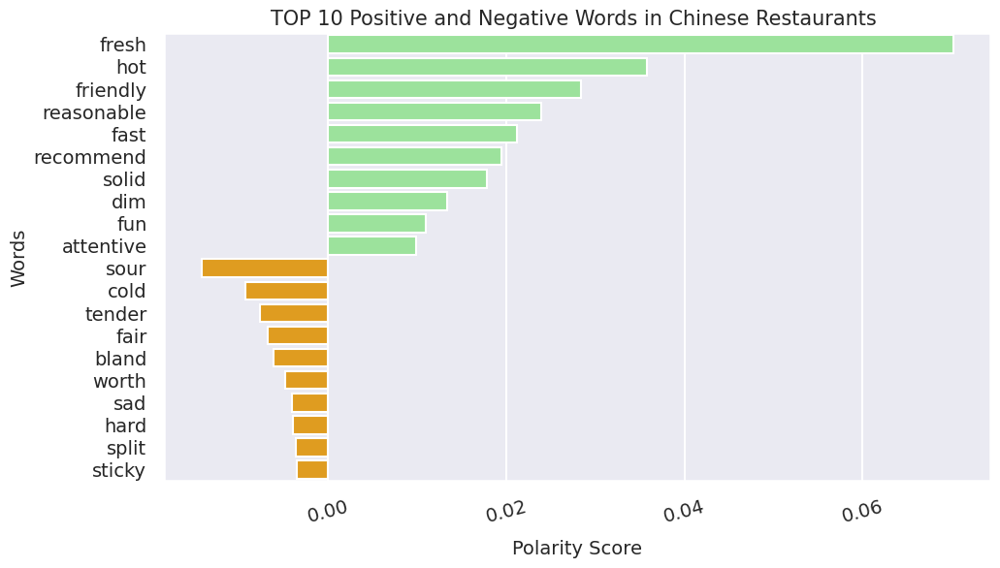

In [38]:
Chinese_top_words = Chinese_polarity_score.loc[get_top_words(Chinese_polarity_score, 'positive',10).index.tolist()+ \
                                                get_top_words(Chinese_polarity_score, 'negetive',10).index.tolist(),'polarity']
plot_top_words(Chinese_top_words,'Chinese')

For restaurants having chinese cuisine, it can be said that fresh and hot food is served at large which people most people approve of. However it is observed that sourness, coldness and tenderness are most complained about features in chinese cuisine hosting restaurants.

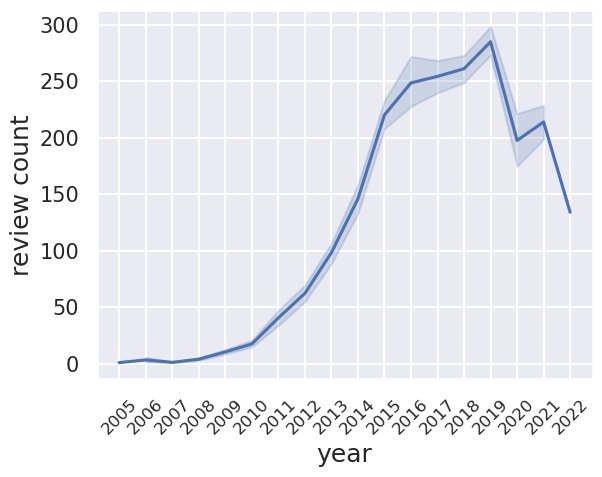

In [34]:
despite being native def time_series(category):
    general_time=get_dataset_time(category)
    general_time['year']=pd.to_datetime(general_time['date']).dt.year
    general_time['month']=pd.to_datetime(general_time['date']).dt.month
    general_time['month/year']=general_time['month'].astype(str)+"/"+general_time['year'].astype(str)
    general_pect = general_time.groupby(['month/year'])[['review_id']].count()
    general_pect.reset_index(inplace = True)
    general_pect['year']=general_pect['month/year'].str.split('/').str[1]
    general_pect.sort_values(by='year',inplace=True)
    return general_pect

sns.lineplot(x = 'year',y= 'review_id',data = time_series('Chinese'))
plt.xticks(rotation = 45,fontsize=12)
plt.yticks(fontsize=15)
plt.ylabel('review count')
plt.show()

Number of reviews give an idea about engagement on the Yelp platform. As observed review count and consequently user engagement per year were steadily increasing upto 2019. A sharp drop is seen in review counts in 2020, when covid pandemic began and restaurants were shut.

**Traditional American**

In [96]:
Traditional_American_reviews = get_dataset('Traditional American')
Traditional_American_train = split_data(Traditional_American_reviews, 0.9)
print('Total %d number of reviews' % Traditional_American_train.shape[0])

Total 16764 number of reviews


In [97]:
Traditional_American_polarity_score = get_polarity_score(Traditional_American_train)

In [98]:
get_top_words(Traditional_American_polarity_score, 'positive',10)

,score,frequency,polarity
word,,,
friendly,0.348667,2367,0.049230
fun,0.567438,778,0.026334
fresh,0.282207,1534,0.025824
recommend,0.219385,1436,0.018792
outstanding,0.693674,345,0.014276
perfection,0.833974,242,0.012039
die,0.803757,250,0.011986
incredible,0.700564,236,0.009862
variety,0.395105,385,0.009074


In [100]:
get_top_words(Traditional_American_polarity_score,'negative',10)

,score,frequency,polarity
word,,,
cold,-0.399106,303,-0.007214
slow,-0.459838,198,-0.005431
hard,-0.198688,373,-0.004421
wrong,-0.242622,268,-0.003879
bland,-0.836158,64,-0.003192
loud,-0.275195,175,-0.002873
frozen,-0.512763,90,-0.002753
expensive,-0.350219,129,-0.002695
dirty,-0.715174,59,-0.002517


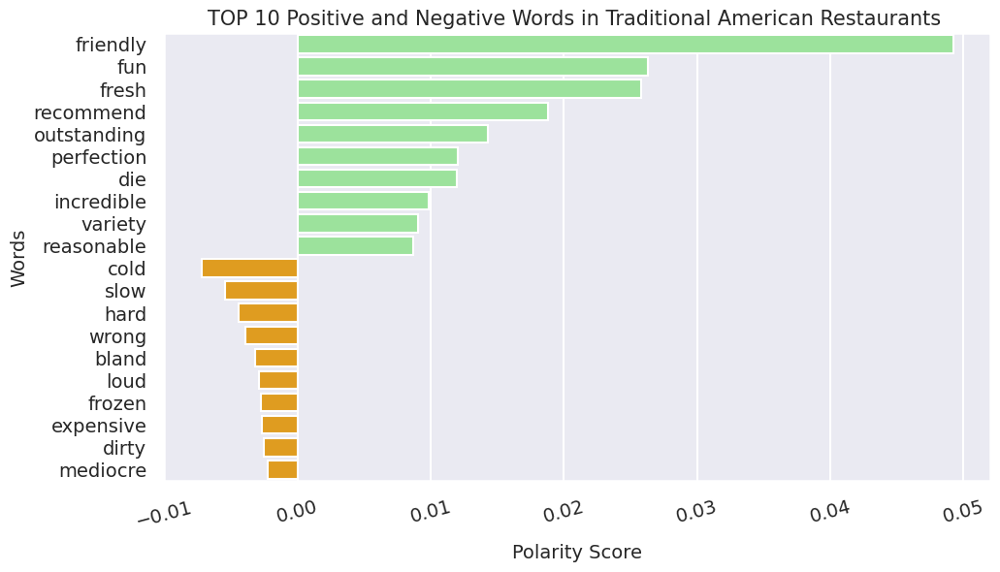

In [101]:
Traditional_American_top_words = Traditional_American_polarity_score.loc[get_top_words(Traditional_American_polarity_score, 'positive',10).index.tolist()+ \
                                                get_top_words(Traditional_American_polarity_score, 'negetive',10).index.tolist(),'polarity']
plot_top_words(Traditional_American_top_words,'Traditional American')

Traditional American cuisine restaurants appear to be friendly and fun places to be at. An unusual word 'die' appears in positive words, as it turns out after inspecting the reviews, most of the reviews mention 'to die for' in positive manner, hence the word 'die' in positive words.

Cold, slow and hard indicates poor food quality and service provided to customers giving negative reviews

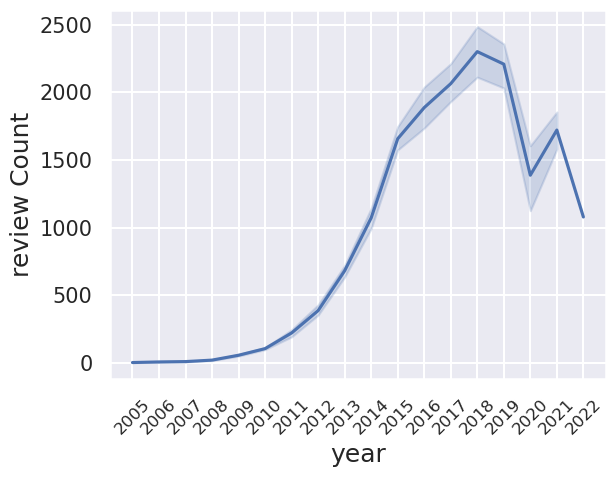

In [103]:
sns.lineplot(x = 'year',y= 'review_id',data = time_series('Traditional American'))
plt.xticks(rotation = 45,fontsize=12)
plt.yticks(fontsize=15)
plt.ylabel("review Count")
plt.show()

Similar to Traditional american, there is steady growth in review count and sharp drop in 2020 due to covid. However a slight drop in review count in 2018 is observed, this could be attributed to the traditional American Cuisine losing popularity as opposed to newer, fresher and more traditional ethnic cuisines that have slowly become more popular

**Middle Eastern**

In [106]:
Middle_Eastern_reviews = get_dataset('Middle Eastern')
Middle_Eastern_train = split_data(Middle_Eastern_reviews, 0.9)
print('Total %d number of reviews' % Middle_Eastern_train.shape[0])

Total 520 number of reviews


In [107]:
Middle_Eastern_polarity_score = get_polarity_score(Middle_Eastern_train)
Middle_Eastern_polarity_score

,score,frequency,polarity
word,,,
abounds,0.052718,1,0.000101
abrasive,-0.224333,0,-0.000000
accolades,0.000000,1,0.000000
addicted,0.000000,1,0.000000
adorable,0.000000,1,0.000000
...,...,...,...
worth,-0.115629,28,-0.006226
worthy,0.000000,1,0.000000
wow,-0.003539,12,-0.000082


In [108]:
get_top_words(Middle_Eastern_polarity_score, 'positive',10)

,score,frequency,polarity
word,,,
fresh,0.503525,156,0.151057
friendly,0.604304,105,0.122023
recommend,0.257620,62,0.030716
authentic,0.280051,44,0.023697
clean,0.212061,43,0.017536
enjoy,0.335654,21,0.013555
generous,0.531735,11,0.011248
seasoned,0.175210,32,0.010782
split,0.433548,9,0.007504


In [109]:
get_top_words(Middle_Eastern_polarity_score,'negative',10)

,score,frequency,polarity
word,,,
fast,-0.232582,33,-0.014760
sweet,-0.205409,23,-0.009085
fried,-0.233136,20,-0.008967
slow,-0.657745,7,-0.008854
support,-0.590544,7,-0.007950
worth,-0.115629,28,-0.006226
pleasant,-0.395201,8,-0.006080
hard,-0.341023,9,-0.005902
cold,-0.777711,3,-0.004487


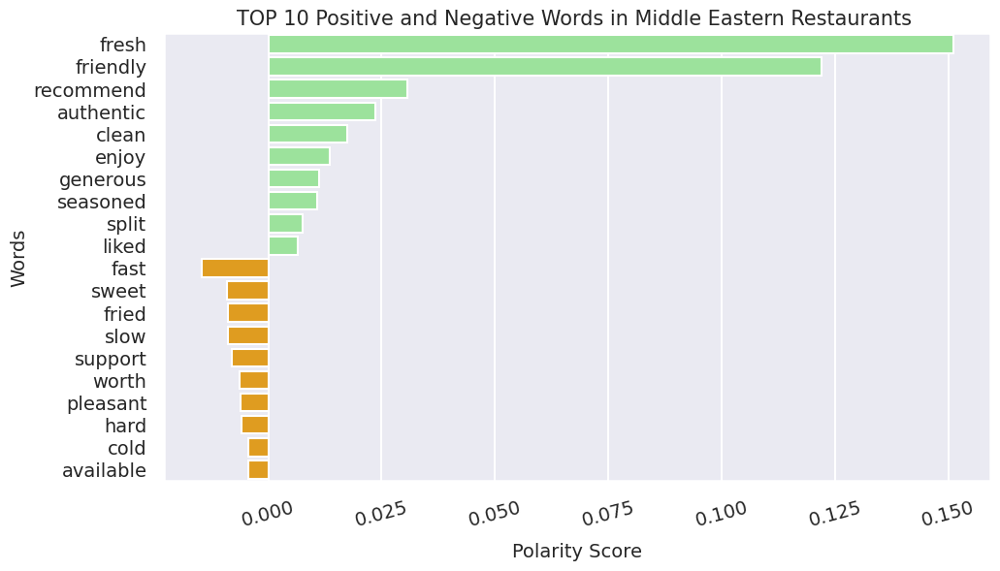

In [110]:
Middle_Eastern_top_words = Middle_Eastern_polarity_score.loc[get_top_words(Middle_Eastern_polarity_score, 'positive',10).index.tolist()+ \
                                                get_top_words(Middle_Eastern_polarity_score, 'negetive',10).index.tolist(),'polarity']
plot_top_words(Middle_Eastern_top_words,'Middle Eastern')

Middle eastern cuisine restaurants staff appear to be friendly and serving fresh food. Whereas the negative reviews point towards food being too sweet and fried.

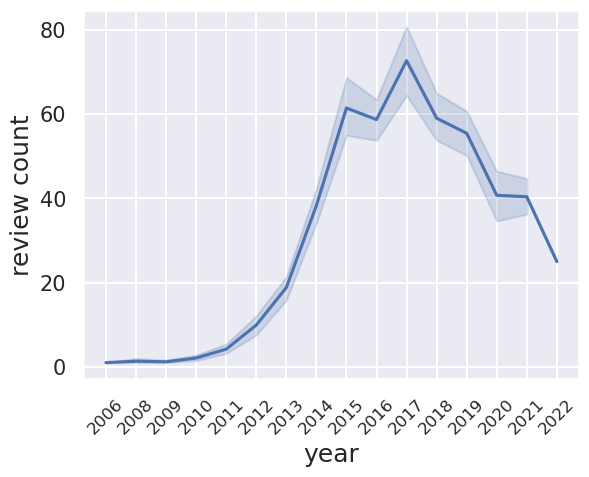

In [112]:
sns.lineplot(x = 'year',y= 'review_id',data = time_series('Middle Eastern'))
plt.xticks(rotation = 45,fontsize=12)
plt.yticks(fontsize=15)
plt.ylabel("review count")
plt.show()

Review count pattern observed is different than for other two cuisines. A sharp drop in review counts is seen in 2018 and the drop in count continues till 2022. However with the large popularity and average rating compared to the smaller review samples we cannot make speculations as to why

**Thai**

In [114]:
Thai_reviews = get_dataset('Thai')
Thai_train = split_data(Thai_reviews, 0.9)
print('Total %d number of reviews' % Thai_train.shape[0])

Total 1803 number of reviews


In [115]:
Thai_polarity_score = get_polarity_score(Thai_train)

In [62]:
get_top_words(Thai_polarity_score, 'positive',10)

,score,frequency,polarity
word,,,
friendly,0.492485,274,0.074842
fresh,0.181236,352,0.035383
reasonable,0.758760,70,0.029458
authentic,0.356683,110,0.021761
generous,0.764846,40,0.016968
fried,0.100936,241,0.013492
phenomenal,0.979285,24,0.013035
recommend,0.115907,195,0.012536
attentive,0.335010,66,0.012263


In [116]:
get_top_words(Thai_polarity_score,'negative',10)

,score,frequency,polarity
word,,,
fried,-0.233211,227,-0.029362
hard,-0.360968,37,-0.007408
seasoned,-0.825122,13,-0.005949
clean,-0.075609,135,-0.005661
sweet,-0.071282,139,-0.005495
cold,-0.747993,13,-0.005393
cool,-0.315391,29,-0.005073
expensive,-1.007881,9,-0.005031
bland,-1.431294,6,-0.004763


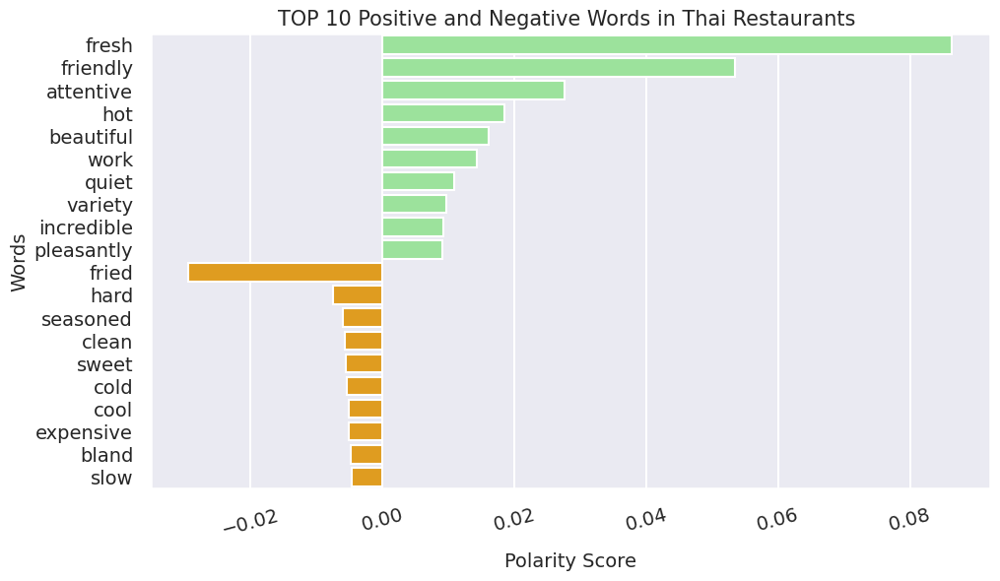

In [117]:
Thai_top_words = Thai_polarity_score.loc[get_top_words(Thai_polarity_score, 'positive',10).index.tolist()+ \
                                                get_top_words(Thai_polarity_score, 'negetive',10).index.tolist(),'polarity']
plot_top_words(Thai_top_words,'Thai')

Thai Cuisine restaurants seem to have friendly staff and serving fresh food, and are attentive to customers. 

Fried appears as the strongest negative word which suggests excess fried food in thai restaurants might not be liked by most people eating at thai restaurants.

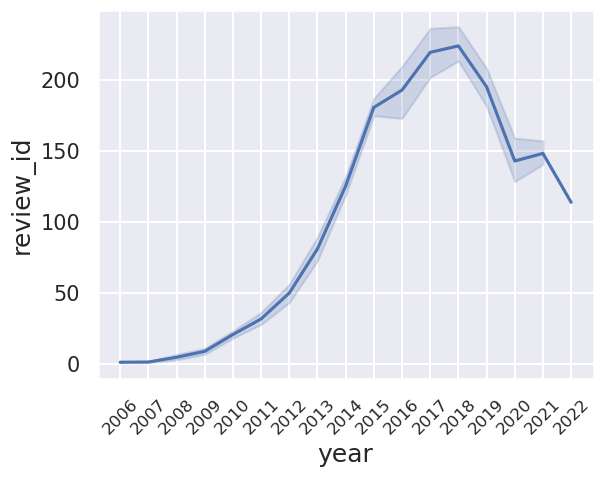

In [118]:
sns.lineplot(x = 'year',y= 'review_id',data = time_series('Thai'))
plt.xticks(rotation = 45,fontsize=12)
plt.yticks(fontsize=15)
plt.show()

**Indian**

In [119]:
Indian_reviews = get_dataset('Indian')
Indian_train = split_data(Indian_reviews, 0.9)
print('Total %d number of reviews' % Indian_train.shape[0])

Total 866 number of reviews


In [120]:
Indian_polarity_score = get_polarity_score(Indian_train)

In [121]:
get_top_words(Indian_polarity_score, 'positive',10)

,score,frequency,polarity
word,,,
fresh,0.265384,115,0.035241
authentic,0.416847,70,0.033694
pleasant,1.196711,23,0.031783
helpful,0.720718,22,0.018309
attentive,0.393650,40,0.018182
friendly,0.143884,105,0.017446
beautiful,0.717421,21,0.017397
fast,0.554184,25,0.015998
enjoy,0.571987,22,0.014531


In [122]:
get_top_words(Indian_polarity_score,'negative',10)

,score,frequency,polarity
word,,,
clean,-0.264698,42,-0.012838
hot,-0.116212,76,-0.010199
work,-0.368777,20,-0.008517
free,-0.397038,18,-0.008253
expensive,-1.187299,6,-0.008226
hard,-0.399506,16,-0.007381
lack,-0.845975,6,-0.005861
complaint,-0.548278,8,-0.005065
sad,-0.694026,6,-0.004808


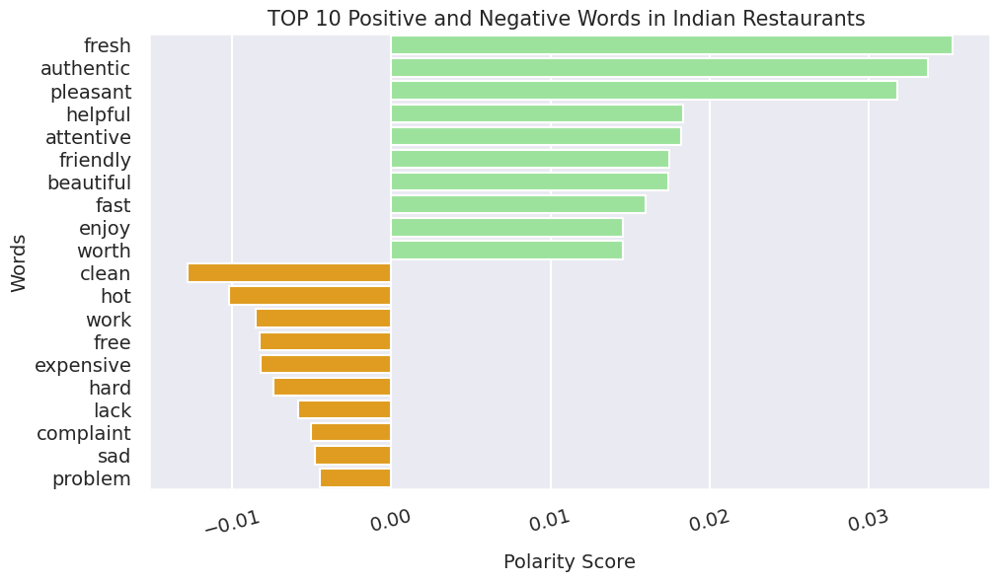

In [123]:
Indian_top_words = Indian_polarity_score.loc[get_top_words(Indian_polarity_score, 'positive',10).index.tolist()+ \
                                                get_top_words(Indian_polarity_score, 'negetive',10).index.tolist(),'polarity']
plot_top_words(Indian_top_words,'Indian')

Indian cuisine restaurants appear to have fresh and authentic and pleasant food. 

Cleanliness in restaurants seems to be an issue in most indian cuisine restaurants, along with hot taste of indian food.

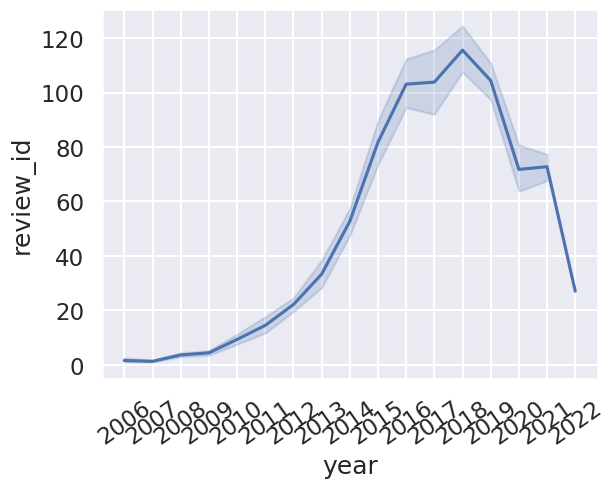

In [71]:
sns.lineplot(x = 'year',y= 'review_id',data = time_series('Indian'))
plt.xticks(rotation = 35)
plt.show()

Seems to be a drop in popularity since 2018 until covid when the economy crashed due to the pandemic